# Motion Analysis with MoveNet



References:
- Movenet TF tutorial
- Action recognition with Inflated 3D CNN tutorial
- InfinityRep dataset
- MPII dataset
- poseevaluator dataset

## Load preliminaries, parameters, set up paths

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import cv2
import yaml
import os
import glob
import pickle as pkl
import sys
import importlib

In [3]:
%cd ..

/Users/donwei7/Documents/code/human_motion_analysis


In [9]:
ROOT_DIR = os.getcwd()
print(ROOT_DIR)

/Users/donwei7/Documents/code/human_motion_analysis


In [4]:
# custom modules
from src.io import iomod
from src.inference import inference
from src.visualization import draw
from src.analysis import analysisphysics
from src.tests import testdraw, structshape
from src.io.utils import Config

# Import plotting libraries
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection # likely limited to draw module
import matplotlib.patches as patches
import seaborn as sns

# Some modules to display an animation using imageio.
import imageio
from IPython.display import HTML, display, Image

In [5]:
config = Config()
name_combinations = config.get_name_combinations()

notes:

In [5]:
'''
loads into dictionaries of keypoints and edges mappings, e.g.:

CONFIG_KEYPOINTS = {
    'nose': 0,
    'left_eye': 1,
    'right_eye': 2,
    'left_ear': 3,
    'right_ear': 4,
    'left_shoulder': 5,
    'right_shoulder': 6,
    'left_elbow': 7,
    'right_elbow': 8,
    'left_wrist': 9,
    'right_wrist': 10,
    'left_hip': 11,
    'right_hip': 12,
    'left_knee': 13,
    'right_knee': 14,
    'left_ankle': 15,
    'right_ankle': 16
}

CONFIG_EDGE_COLORS is an ordered dictionary of edge pairs and colors, e.g.:
OrderedDict([((0, 1), 'm'),
             ((0, 2), 'c'),
             ((0, 5), 'm'),
             ((0, 6), 'c'),
             ((1, 3), 'm'),
             ((2, 4), 'c'),
             ((5, 6), 'y'),
             ((5, 7), 'm'),
             ((5, 11), 'm'),
             ((6, 8), 'c'),
             ((6, 12), 'c'),
             ((7, 9), 'm'),
             ((8, 10), 'c'),
             ((11, 12), 'y'),
             ((11, 13), 'm'),
             ((12, 14), 'c'),
             ((13, 15), 'm'),
             ((14, 16), 'c')])

# use e.g. list(CONFIG_EDGE_COLORS).index((2,4)) to get index of edge color

'''
;

''

From Documentation:

 outputs a float32 tensor of shape [1, 1, 17, 3].

The first two channels of the last dimension represents the yx coordinates (normalized to image frame, i.e. range in [0.0, 1.0]) of the 17 keypoints (in the order of: [nose, left eye, right eye, left ear, right ear, left shoulder, right shoulder, left elbow, right elbow, left wrist, right wrist, left hip, right hip, left knee, right knee, left ankle, right ankle]).

The third channel of the last dimension represents the prediction confidence scores of each keypoint, also in the range [0.0, 1.0].

expected input: 
A frame of video or an image, represented as an int32 tensor of shape: 256x256x3. Channels order: RGB with values in [0, 255].

### load model from TF hub

In [7]:
MODEL_NAME = config.params["MODEL_NAME"]

if "tflite" in MODEL_NAME:
  if "movenet_lightning_f16" in MODEL_NAME:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/lightning/tflite/float16/4?lite-format=tflite
    input_size = 192
  elif "movenet_thunder_f16" in MODEL_NAME:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
    input_size = 256
  elif "movenet_lightning_int8" in MODEL_NAME:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/lightning/tflite/int8/4?lite-format=tflite
    input_size = 192
  elif "movenet_thunder_int8" in MODEL_NAME:
    !wget -q -O model.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/int8/4?lite-format=tflite
    input_size = 256
  else:
    raise ValueError("Unsupported model name: %s" % MODEL_NAME)

  # Initialize the TFLite interpreter
  interpreter = tf.lite.Interpreter(model_path="model.tflite")
  interpreter.allocate_tensors()

  def movenet(input_image):
    """Runs detection on an input image.

    Args:
      input_image: A [1, height, width, 3] tensor represents the input image
        pixels. Note that the height/width should already be resized and match the
        expected input resolution of the model before passing into this function.

    Returns:
      A [1, 1, 17, 3] float numpy array representing the predicted keypoint
      coordinates and scores.
    """
    # TF Lite format expects tensor type of uint8.
    input_image = tf.cast(input_image, dtype=tf.uint8)
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    interpreter.set_tensor(input_details[0]['index'], input_image.numpy())
    # Invoke inference.
    interpreter.invoke()
    # Get the model prediction.
    keypoints_with_scores = interpreter.get_tensor(output_details[0]['index'])
    return keypoints_with_scores

else:
  if "movenet_lightning" in MODEL_NAME:
    module = hub.load("https://tfhub.dev/google/movenet/singlepose/lightning/4")
    input_size = 192
  elif "movenet_thunder" in MODEL_NAME:
    module = hub.load("https://tfhub.dev/google/movenet/singlepose/thunder/4")
    input_size = 256
  else:
    raise ValueError("Unsupported model name: %s" % MODEL_NAME)

  def movenet(input_image):
    """Runs detection on an input image.

    Args:
      input_image: A [1, height, width, 3] tensor represents the input image
        pixels. Note that the height/width should already be resized and match the
        expected input resolution of the model before passing into this function.

    Returns:
      A [1, 1, 17, 3] float numpy array representing the predicted keypoint
      coordinates and scores.
    """
    model = module.signatures['serving_default']

    # SavedModel format expects tensor type of int32.
    input_image = tf.cast(input_image, dtype=tf.int32)
    # Run model inference.
    outputs = model(input_image)
    # Output is a [1, 1, 17, 3] tensor.
    keypoints_with_scores = outputs['output_0'].numpy()
    return keypoints_with_scores
    

2022-12-14 12:34:49.339723: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [8]:
# progress bar
def progress(value, max=100):
  return HTML("""
      <progress
          value='{value}'
          max='{max}',
          style='width: 100%'
      >
          {value}
      </progress>
  """.format(value=value, max=max))

## Single Image Example
This session demonstrates the minumum working example of running the model on a **single image** to predict the 17 human keypoints.

### Load Input Image

In [8]:
!curl -o input_image.jpeg https://images.pexels.com/photos/4384679/pexels-photo-4384679.jpeg --silent

In [27]:
# Load the input image.
image_path = 'input_image.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image)

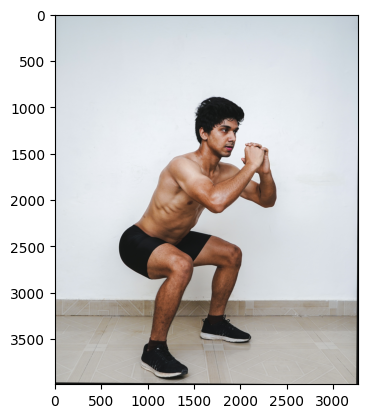

In [33]:
plt.imshow(image)

### Run Inference

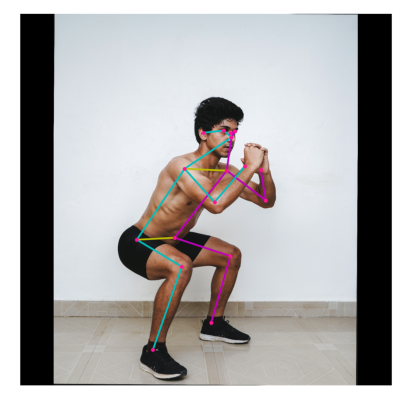

In [40]:
# Resize and pad the image to keep the aspect ratio and fit the expected size.
input_image = tf.expand_dims(image, axis=0)
input_image = tf.image.resize_with_pad(input_image, input_size, input_size)

# Run model inference.
keypoints_with_scores = movenet(input_image)

# Visualize the predictions with image.
display_image = tf.expand_dims(image, axis=0)
display_image = tf.cast(tf.image.resize_with_pad(
    display_image, 1280, 1280), dtype=tf.int32)
output_overlay = draw.draw_prediction_on_image(
    np.squeeze(display_image.numpy(), axis=0), keypoints_with_scores, CONFIG_EDGE_COLORS)

plt.figure(figsize=(5, 5))
plt.imshow(output_overlay)
_ = plt.axis('off')

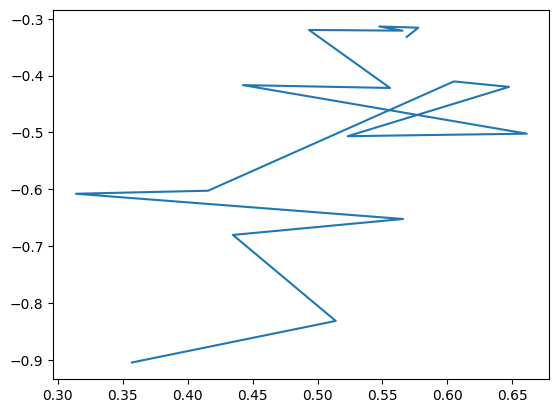

In [41]:
# num_instances?, instance?, kpts, (y, x, confidence)
x = keypoints_with_scores[0, 0, :, 1]
y = keypoints_with_scores[0, 0, :, 0]
plt.plot(x, -y)

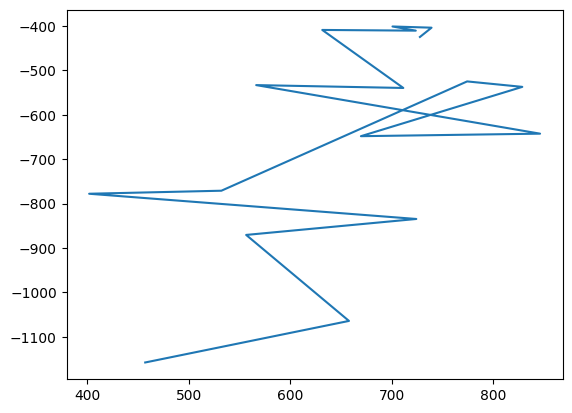

In [42]:
kpts_xy, edges_xy, edge_colors = draw._keypoints_and_edges_for_display(keypoints_with_scores, CONFIG_EDGE_COLORS, 1280, 1280)

plt.plot(kpts_xy[:, 0], -kpts_xy[:, 1])

## Video (Image Sequence) Example
This section demonstrates how to apply intelligent cropping based on detections from the previous frame when the input is a sequence of frames. This allows the model to devote its attention and resources to the main subject, resulting in much better prediction quality without sacrificing the speed.


### Load Input Image Sequence

In [14]:
!pip install wget
import wget
wget.download(r"https://github.com/tensorflow/tfjs-models/raw/master/pose-detection/assets/dance_input.gif")

'dance_input (1).gif'

In [10]:
# Load the input image.
test_path = 'dance_input.gif'

### Run Inference with Cropping Algorithm

In [ ]:
  samplevid = iomod.load_video(test_path)

  # # Make a gif and save
  fgifpath = f"{test_path}_test_thunder4.gif"
  iomod.imageio.mimsave(fgifpath, samplevid)

  # Read & decode from saved file
  imagesgif = tf.io.read_file(fgifpath)
  images = tf.image.decode_gif(imagesgif)

  # Run inference
  out_keypoints, out_edges = \
      inference.inference_video(movenet, images, input_size, \
                                config.kpts, config.edges, config.params['KEYPOINT_THRESH_SCORE_CROP'], config.params)
  
  print("Processed inference:", fgifpath)

  # Get mask for labeling edges based on velocity
  mask_edge = analysisphysics.compute_edge_velocities(out_edges, config.params["EDGE_VEL_THRESH"])


  output_images, output_images2 = \
      draw.wrap_draw_subplots(images, out_keypoints, out_edges, config.edges, \
                              mask_edge=mask_edge, figsize=(10,10))


  # Prepare gif visualization.
  output2 = np.stack(output_images2, axis=0)
  iomod.convert_to_gif(output2, fgifpath, fps=10)

  print("Processed & Saved gif to", fgifpath)

In [22]:
output_images2[0].shape

(1000, 1000, 3)

(-0.5, 999.5, 999.5, -0.5)

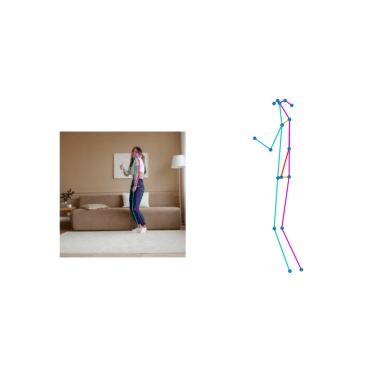

In [29]:
# display image
# display(Image(filename=fgifpath))
frame_idx = 0
image = output_images2[4]
plt.imshow(image)
plt.axis('off')


## test on random images external to training set

(390, 720, 3)


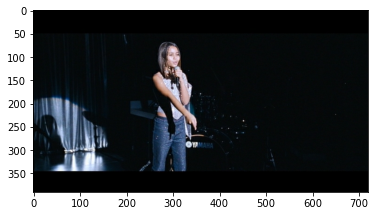

In [23]:
test_image_path = os.path.join(ROOT_DIR, "data", "poseevaluator_dataset", "images", "love", "161498.jpg")
image = tf.image.decode_jpeg(tf.io.read_file(test_image_path)) # object --> tensor
print(image.shape)
plt.imshow(image)

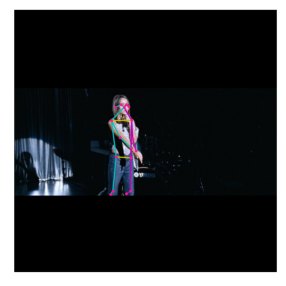

In [26]:
input_image = tf.expand_dims(image, axis=0)
input_image = tf.image.resize_with_pad(input_image, input_size, input_size)
keypoints_with_scores = movenet(input_image)

# Visualize the predictions with image.
display_image = tf.expand_dims(image, axis=0)
display_image = tf.cast(tf.image.resize_with_pad(
    display_image, 1280, 1280), dtype=tf.int32)
output_overlay = draw.draw_prediction_on_image(
    np.squeeze(display_image.numpy(), axis=0), keypoints_with_scores, CONFIG_EDGE_COLORS)

plt.figure(figsize=(5, 5))
plt.imshow(output_overlay)
_ = plt.axis('off')

try with image sequence (gif first)

In [33]:
import imageio
images = []
love_path = os.path.join(ROOT_DIR, "data", "poseevaluator_dataset", "images", "love")
file_paths = [os.path.join(love_path, f) for f in os.listdir(love_path) if f.endswith(".jpg")]

In [34]:
for path in file_paths:
    images.append(imageio.imread(path))
imageio.mimsave('images_test.gif', images)

In [ ]:
# Load the input image.
image_path = 'images_test.gif'
image = tf.io.read_file(image_path)
image = tf.image.decode_gif(image)

# Load the input image.
num_frames, image_height, image_width, _ = image.shape
crop_region = inference.init_crop_region(image_height, image_width)

output_images = []
for frame_idx in range(num_frames):
  keypoints_with_scores = inference.inference_image(
      movenet, image[frame_idx, :, :, :], crop_region,
      crop_size=[input_size, input_size])
  output_images.append(draw.draw_prediction_on_image(
      image[frame_idx, :, :, :].numpy().astype(np.int32),
      keypoints_with_scores, CONFIG_EDGE_COLORS, crop_region=None,
      close_figure=True, output_image_height=300))
  crop_region = inference.determine_crop_region(
      keypoints_with_scores, image_height, image_width, CONFIG_KEYPOINTS, KEYPOINT_THRESH_SCORE_CROP)

# Prepare gif visualization.
output = np.stack(output_images, axis=0)
iomod.to_gif(output, fps=5)

looks to perform okay in a range of difficult situations, issues with multiple instances

### try on various datasets

In [57]:
file_directories2 = [os.path.join(ROOT_DIR, "data", "mpii", "subsamples", "basketball", "003594227"), 
                    os.path.join(ROOT_DIR, "data", "mpii", "subsamples", "fitness", "003118314"),
                    os.path.join(ROOT_DIR, "data", "mpii", "subsamples", "fitness", "008692029"),
                    os.path.join(ROOT_DIR, "data", "mpii", "subsamples", "racquetball", "007276301"),
                    os.path.join(ROOT_DIR, "data", "mpii", "subsamples", "synchronized_swimming", "011323805"),
                    os.path.join(ROOT_DIR, "data", "yoga_poses", "train", "warrior"),
                    os.path.join(ROOT_DIR, "data", "yoga_poses", "train", "chair")]

# make gif and save in each folder
for dir_path in file_directories2:
    filepaths2 = [os.path.join(dir_path, f) for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f)) and f[-3:] == 'jpg']
    images = []
    
    for filepath in filepaths2:
        # full_filename_path = f"{file_dir}\{filename}"
        images.append(imageio.imread(filepath))

    fgifpath = f"{dir_path}\images_test.gif"
        
    imageio.mimsave(fgifpath, images)

    '''same as taken above now on per folder basis'''

    # Load the input image.
    image_path = fgifpath
    image = tf.io.read_file(image_path)
    image = tf.image.decode_gif(image)

    # Load the input image.
    num_frames, image_height, image_width, _ = image.shape
    crop_region = inference.init_crop_region(image_height, image_width)

    output_images = []
    for frame_idx in range(num_frames):
        keypoints_with_scores = inference.inference_image(
            movenet, image[frame_idx, :, :, :], crop_region,
            crop_size=[input_size, input_size])
        output_images.append(draw.draw_prediction_on_image(
            image[frame_idx, :, :, :].numpy().astype(np.int32),
            keypoints_with_scores, CONFIG_EDGE_COLORS, crop_region=None,
            close_figure=True, output_image_height=300))
        crop_region = inference.determine_crop_region(
            keypoints_with_scores, image_height, image_width, CONFIG_KEYPOINTS, KEYPOINT_THRESH_SCORE_CROP)

    # Prepare gif visualization.
    output = np.stack(output_images, axis=0)
    foutpath = fgifpath + "_labeled.gif"
    iomod.convert_to_gif(output, foutpath, fps=5)


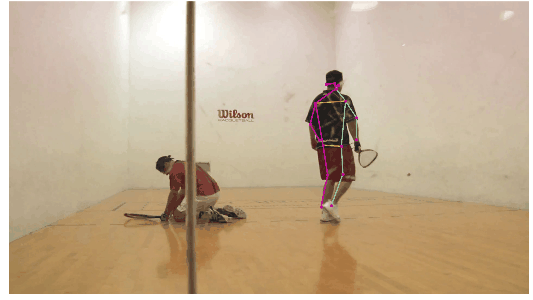

In [72]:
Image(open(r'C:\MLprojects\motion_analysis\data\mpii\subsamples\racquetball\007276301\images_test.gif_labeled.gif','rb').read())

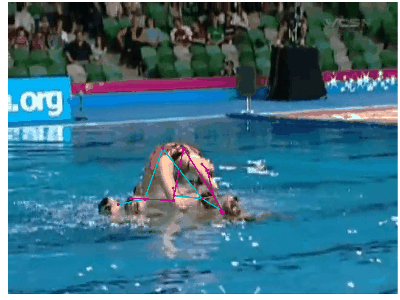

In [71]:
Image(open(r'C:\MLprojects\motion_analysis\data\mpii\subsamples\synchronized_swimming\011323805\images_test.gif_labeled.gif','rb').read())

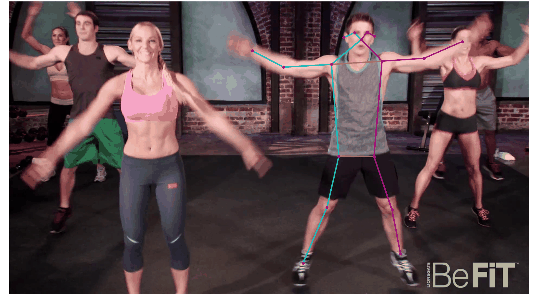

In [73]:
Image(open(r'C:\MLprojects\motion_analysis\data\mpii\subsamples\fitness\003118314\images_test.gif_labeled.gif','rb').read())

may be more useable for constrained fitness motion situations